In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
%cd /content

/content


In [ ]:
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"prabritbandyopadhyay","key":"9fdb7602faea760a44b23259b90e8585"}'}

In [ ]:
! pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!ls

drive  kaggle.json  sample_data


In [ ]:
%cd /content/drive/MyDrive/intel

/content/drive/MyDrive/intel


In [ ]:
!pwd

/content/drive/MyDrive/intel


In [ ]:
!kaggle datasets download -d puneet6060/intel-image-classification

 96% 331M/346M [00:02<00:00, 149MB/s]
100% 346M/346M [00:02<00:00, 128MB/s]


In [ ]:
!ls


intel-image-classification.zip


In [ ]:
!unzip intel-image-classification.zip -d /content/drive/MyDrive/intel

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7506.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7537.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7539.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7551.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7560.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7565.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7578.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7581.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7586.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7647.jpg  
  inflating: /content/drive/MyDrive/intel/seg_train/seg_train/mountain/7652.jpg  
  inflating: /content/drive/MyDrive/intel/seg_t

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm
import PIL
from PIL import Image

In [ ]:





DATADIR = "/content/drive/MyDrive/intel/seg_train/seg_train"

CATEGORIES = ["buildings", "forest","glacier","mountain","sea","street"]

for category in CATEGORIES:  # do dogs and cats
    path = os.path.join(DATADIR,category)  # create path to dogs and cats
    for img in os.listdir(path):  # iterate over each image per dogs and cats
        img_array = cv2.imread(os.path.join(path,img) ,cv2.COLOR_BGR2RGB)  # convert to array

        plt.imshow(img_array)  # graph it
        plt.show()  # display!
        img = PIL.Image.open(os.path.join(path,img))
        wid, hgt = img.size
        print(str(wid) + "x" + str(hgt))


        break  # we just want one for now so break
    break  #...and one more!

FileNotFoundError: ignored

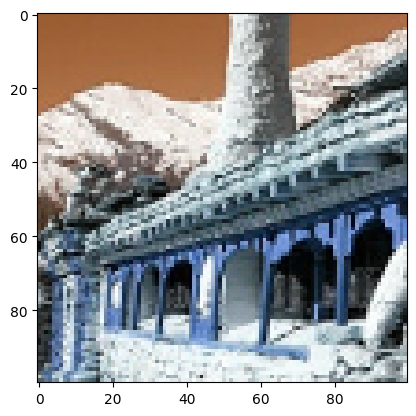

In [ ]:
IMG_SIZE = 100

new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE),3)
plt.imshow(new_array)
plt.show()

In [ ]:
training_data = []

DATADIR = "/content/drive/MyDrive/intel/seg_train/seg_train"

CATEGORIES = ["buildings", "forest","glacier","mountain","sea","street"]

def create_training_data():
    for category in CATEGORIES:  # do dogs and cats

        path = os.path.join(DATADIR,category)  # create path to dogs and cats
        class_num = CATEGORIES.index(category)  # get the classification  (0 or a 1). 0=dog 1=cat

        for img in tqdm(os.listdir(path)):  # iterate over each image per dogs and cats
            try:
                img_array = cv2.imread(os.path.join(path,img) ,cv2.COLOR_BGR2RGB)  # convert to array
                new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
                training_data.append([new_array, class_num])  # add this to our training_data
            except Exception as e:  # in the interest in keeping the output clean...
                pass
            #except OSError as e:
            #    print("OSErrroBad img most likely", e, os.path.join(path,img))
            #except Exception as e:
            #    print("general exception", e, os.path.join(path,img))

create_training_data()

print(len(training_data))

100%|██████████| 2382/2382 [00:48<00:00, 49.07it/s] 

14034


In [ ]:
testing_data = []

DATADIR = "/content/drive/MyDrive/intel/seg_test/seg_test"

CATEGORIES = ["buildings", "forest","glacier","mountain","sea","street"]

def create_testing_data():
    for category in CATEGORIES:

        path = os.path.join(DATADIR,category)
        class_num = CATEGORIES.index(category)  # get the classification
        print(CATEGORIES)
        print(CATEGORIES.index)

        for img in tqdm(os.listdir(path)):  # iterate over each image
            try:
                img_array = cv2.imread(os.path.join(path,img) ,cv2.COLOR_BGR2RGB)  # convert to array
                new_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))  # resize to normalize data size
                testing_data.append([new_array, class_num])  # add this to our training_data
            except Exception as e:  # in the interest in keeping the output clean...
                pass
            #except OSError as e:
            #    print("OSErrroBad img most likely", e, os.path.join(path,img))
            #except Exception as e:
            #    print("general exception", e, os.path.join(path,img))

create_testing_data()

print(len(testing_data))

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
<built-in method index of list object at 0x7f054294cec0>


100%|██████████| 437/437 [00:07<00:00, 56.81it/s] 


['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
<built-in method index of list object at 0x7f054294cec0>


100%|██████████| 474/474 [00:09<00:00, 50.96it/s] 


['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
<built-in method index of list object at 0x7f054294cec0>


100%|██████████| 553/553 [00:08<00:00, 64.01it/s] 


['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
<built-in method index of list object at 0x7f054294cec0>


100%|██████████| 525/525 [00:08<00:00, 61.09it/s] 


['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
<built-in method index of list object at 0x7f054294cec0>


100%|██████████| 510/510 [00:08<00:00, 59.11it/s] 


['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']
<built-in method index of list object at 0x7f054294cec0>


100%|██████████| 501/501 [00:09<00:00, 52.52it/s] 

3000


In [ ]:

import random

random.shuffle(testing_data)
random.shuffle(training_data)

In [ ]:
X_test = []
y_test = []

for features,label in testing_data:
    X_test.append(features)
    y_test.append(label)

In [ ]:
X_test = np.array(X_test).reshape(-1, IMG_SIZE, IMG_SIZE, 3)
X_test = X_test/255


In [ ]:
X_test.shape

(3000, 100, 100, 3)

In [ ]:
for sample in training_data[-10:]:
    print(sample[1])

0
3
1
2
5
3
0
0
1
5


In [ ]:
X = []
y = []

for features,label in training_data:
    X.append(features)
    y.append(label)

In [ ]:
X = np.array(X).reshape(-1, IMG_SIZE, IMG_SIZE, 3)
X.shape

(14034, 100, 100, 3)

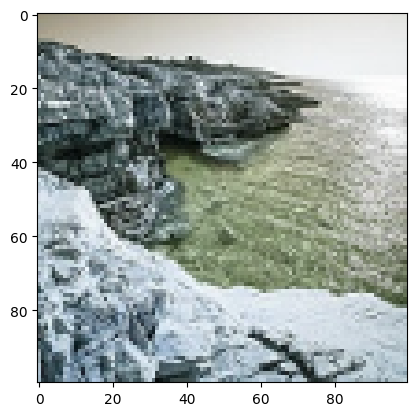

In [ ]:
plt.imshow(X[15])

In [ ]:


X = X/255

In [ ]:
import pickle

pickle_out = open("/content/drive/MyDrive/intel/seg_train/seg_train/X.pickle","wb")
pickle.dump(X, pickle_out)
pickle_out.close()

pickle_out = open("/content/drive/MyDrive/intel/seg_train/seg_train/X_test.pickle","wb")
pickle.dump(X_test, pickle_out)
pickle_out.close()

pickle_out = open("/content/drive/MyDrive/intel/seg_train/seg_train/y.pickle","wb")
pickle.dump(y, pickle_out)
pickle_out.close()

pickle_out = open("/content/drive/MyDrive/intel/seg_train/seg_train/y_test.pickle","wb")
pickle.dump(y_test, pickle_out)
pickle_out.close()

In [ ]:
import pickle
pickle_in = open("/content/drive/MyDrive/intel/seg_train/seg_train/X.pickle","rb")
X = pickle.load(pickle_in)

pickle_in = open("/content/drive/MyDrive/intel/seg_train/seg_train/X_test.pickle","rb")
X_test = pickle.load(pickle_in)

pickle_in = open("/content/drive/MyDrive/intel/seg_train/seg_train/y.pickle","rb")
y = pickle.load(pickle_in)

pickle_in = open("/content/drive/MyDrive/intel/seg_train/seg_train/y_test.pickle","rb")
y_test = pickle.load(pickle_in)


In [ ]:
X_test[0]

array([[[0.42745098, 0.6       , 0.52156863],
        [0.23921569, 0.4       , 0.31372549],
        [0.21568627, 0.37647059, 0.29411765],
        ...,
        [0.43529412, 0.6745098 , 0.59607843],
        [0.38431373, 0.60784314, 0.52156863],
        [0.45098039, 0.61176471, 0.55294118]],

       [[0.51764706, 0.71764706, 0.63921569],
        [0.24705882, 0.42745098, 0.34509804],
        [0.3254902 , 0.47843137, 0.40784314],
        ...,
        [0.27843137, 0.51372549, 0.41176471],
        [0.49803922, 0.76862745, 0.64705882],
        [0.36078431, 0.63137255, 0.52156863]],

       [[0.59215686, 0.76470588, 0.69019608],
        [0.52941176, 0.69019608, 0.62352941],
        [0.45098039, 0.59607843, 0.5372549 ],
        ...,
        [0.16862745, 0.40392157, 0.30196078],
        [0.40392157, 0.70588235, 0.57647059],
        [0.20784314, 0.5254902 , 0.40784314]],

       ...,

       [[0.15686275, 0.20392157, 0.19607843],
        [0.18039216, 0.23921569, 0.23529412],
        [0.11764706, 0

In [ ]:
import tensorflow as tf
import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D
import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
from tqdm import tqdm

In [ ]:
y = np.array(y)
type(y)


numpy.ndarray

In [ ]:
y_test = np.array(y_test)
type(y_test)

numpy.ndarray

In [ ]:
from tensorflow.keras.callbacks import TensorBoard
import datetime

In [ ]:
%load_ext tensorboard

In [ ]:
!kill 14600

/bin/bash: line 0: kill: (14600) - No such process


In [ ]:
log_dir = "logs"
%tensorboard --logdir logs


<IPython.core.display.Javascript object>

In [ ]:
rm -rf ./logs/

In [ ]:
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

In [ ]:
model = Sequential([

    tf.keras.layers.Conv2D(filters=128,kernel_size=(3,3),strides=(2, 2), activation='relu', input_shape=(100, 100, 3)),
    tf.keras.layers.MaxPooling2D((2, 2), strides=1),
    #tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(filters=128,kernel_size=(3,3),strides=(2, 2), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2), strides=1),
    #tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Conv2D(filters=256,kernel_size=(5,5),strides=(2, 2), activation='relu'),
    tf.keras.layers.MaxPooling2D((2, 2), strides=1),
    #tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(512, activation = 'relu' ),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(128, activation = 'relu' ),
    tf.keras.layers.Dense(6, activation = 'softmax')                    #why 1??? also check shape Conv2D


])


model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 49, 49, 128)       3584      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 48, 48, 128)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 23, 23, 128)       147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 22, 22, 128)      0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 9, 9, 256)         819456    
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 8, 8, 256)        0

In [ ]:
layer = model.layers
print(layer)

[<keras.layers.convolutional.Conv2D object at 0x7f3b9dcf2c50>, <keras.layers.pooling.MaxPooling2D object at 0x7f3b9dc7be50>, <keras.layers.convolutional.Conv2D object at 0x7f3b9dc94790>, <keras.layers.pooling.MaxPooling2D object at 0x7f3b9dc94b50>, <keras.layers.convolutional.Conv2D object at 0x7f3b9d406110>, <keras.layers.pooling.MaxPooling2D object at 0x7f3b9d406510>, <keras.layers.core.flatten.Flatten object at 0x7f3b9d406a50>, <keras.layers.core.dense.Dense object at 0x7f3b9d406ad0>, <keras.layers.core.dense.Dense object at 0x7f3b9d406e90>, <keras.layers.core.dense.Dense object at 0x7f3b9d40f290>]


In [ ]:
model = tf.keras.models.Sequential()
model.add(tf.keras.layers.Flatten())   #Flatten the images! Could be done with numpy reshape
model.add(tf.keras.layers.Dense(32, activation=tf.nn.relu, input_shape= X.shape[1:]))
model.add(Dropout(0.25))
model.add(tf.keras.layers.Dense(32, activation=tf.nn.relu))
model.add(tf.keras.layers.Dense(6, activation=tf.nn.softmax))



In [ ]:
model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model.fit(X, y, batch_size=32, epochs=15, validation_split=0.5)
#model.save("/content/drive/MyDrive/intel/model1")

Epoch 1/15
220/220 [==============================] - 21s 47ms/step - loss: 1.2331 - accuracy: 0.4895 - val_loss: 1.0940 - val_accuracy: 0.5566
Epoch 2/15
220/220 [==============================] - 7s 30ms/step - loss: 0.9496 - accuracy: 0.6228 - val_loss: 0.8731 - val_accuracy: 0.6593
Epoch 3/15
220/220 [==============================] - 7s 31ms/step - loss: 0.7915 - accuracy: 0.7023 - val_loss: 0.7448 - val_accuracy: 0.7240
Epoch 4/15
220/220 [==============================] - 5s 25ms/step - loss: 0.7029 - accuracy: 0.7422 - val_loss: 0.6873 - val_accuracy: 0.7547
Epoch 5/15
220/220 [==============================] - 7s 31ms/step - loss: 0.6300 - accuracy: 0.7707 - val_loss: 0.7036 - val_accuracy: 0.7507
Epoch 6/15
220/220 [==============================] - 7s 31ms/step - loss: 0.5875 - accuracy: 0.7858 - val_loss: 0.6944 - val_accuracy: 0.7547
Epoch 7/15
220/220 [==============================] - 7s 32ms/step - loss: 0.4928 - accuracy: 0.8190 - val_loss: 0.6836 - val_accuracy: 0.764

In [ ]:
# A generator that provides a representative dataset
def representative_data_gen():
  dataset_list = tf.data.Dataset.list_files(DATADIR + '/*/*')
  for i in range(100):
    image = next(iter(dataset_list))
    image = tf.io.read_file(image)
    image = tf.io.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [IMG_SIZE, IMG_SIZE])
    image = tf.cast(image / 255., tf.float32)
    image = tf.expand_dims(image, 0)
    yield [image]

converter = tf.lite.TFLiteConverter.from_keras_model(model)
# This enables quantization
converter.optimizations = [tf.lite.Optimize.DEFAULT]
# This sets the representative dataset for quantization
converter.representative_dataset = representative_data_gen
# This ensures that if any ops can't be quantized, the converter throws an error
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# For full integer quantization, though supported types defaults to int8 only, we explicitly declare it for clarity.
converter.target_spec.supported_types = [tf.int8]
# These set the input and output tensors to uint8 (added in r2.3)
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.uint8
tflite_model = converter.convert()

with open('txr.tflite', 'wb') as f:
  f.write(tflite_model)

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
tflite_model = converter.convert()

with open('txr.tflite', 'wb') as f:
  f.write(tflite_model)

/usr/local/lib/python3.10/dist-packages/tensorflow/lite/python/convert.py:789: UserWarning: Statistics for quantized inputs were expected, but not specified; continuing anyway.
  warnings.warn("Statistics for quantized inputs were expected, but not "


In [ ]:
!pwd

/content


In [ ]:
! curl https://packages.cloud.google.com/apt/doc/apt-key.gpg | sudo apt-key add -

! echo "deb https://packages.cloud.google.com/apt coral-edgetpu-stable main" | sudo tee /etc/apt/sources.list.d/coral-edgetpu.list

! sudo apt-get update

! sudo apt-get install edgetpu-compiler

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1210  100  1210    0     0  27500      0 --:--:-- --:--:-- --:--:-- 27500
OK
deb https://packages.cloud.google.com/apt coral-edgetpu-stable main
Get:1 https://cloud.r-project.org/bin/linux/ubuntu focal-cran40/ InRelease [3,622 B]
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2004/x86_64  InRelease
Get:3 https://packages.cloud.google.com/apt coral-edgetpu-stable InRelease [6,332 B]
Get:4 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu focal InRelease [18.1 kB]
Get:5 http://security.ubuntu.com/ubuntu focal-security InRelease [114 kB]
Get:6 https://packages.cloud.google.com/apt coral-edgetpu-stable/main amd64 Packages [2,317 B]
Hit:7 http://archive.ubuntu.com/ubuntu focal InRelease
Get:8 http://archive.ubuntu.com/ubuntu focal-updates InRelease [114 kB]
Hit:9 http://ppa.launchpad.net/cran/libgit2/ubunt

In [ ]:
!ls

intel-image-classification.zip	seg_pred	      tflt.h5
logs				seg_test	      txr_edgetpu.log
logs20220927-050134		seg_train	      txr_edgetpu.tflite
model1				tf_lite_model.tflite  txr.tflite


In [ ]:
! edgetpu_compiler --min_runtime_version 10 txr.tflite

Edge TPU Compiler version 16.0.384591198
Started a compilation timeout timer of 180 seconds.

Model compiled successfully in 29 ms.

Input model: txr.tflite
Input size: 9.01MiB
Output model: txr_edgetpu.tflite
Output size: 9.01MiB
On-chip memory used for caching model parameters: 0.00B
On-chip memory remaining for caching model parameters: 0.00B
Off-chip memory used for streaming uncached model parameters: 0.00B
Number of Edge TPU subgraphs: 0
Total number of operations: 13
Operation log: txr_edgetpu.log

Model successfully compiled but not all operations are supported by the Edge TPU. A percentage of the model will instead run on the CPU, which is slower. If possible, consider updating your model to use only operations supported by the Edge TPU. For details, visit g.co/coral/model-reqs.
Number of operations that will run on Edge TPU: 0
Number of operations that will run on CPU: 13
See the operation log file for individual operation details.
Compilation child process completed within t

In [ ]:
def plotFilters(conv_filter):
    fig, axes = plt.subplots(1, 3, figsize=(5,5))
    axes = axes.flatten()
    for img, ax in zip( conv_filter, axes):
        ax.imshow(img)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

conv2d (3, 3, 3, 128)
128


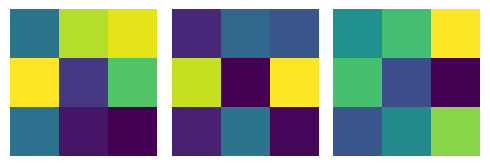

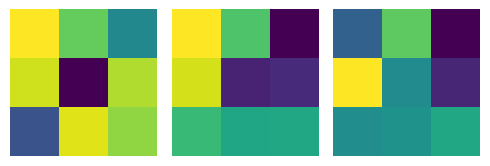

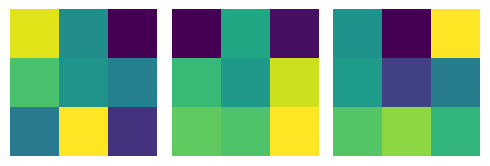

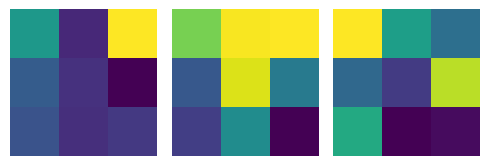

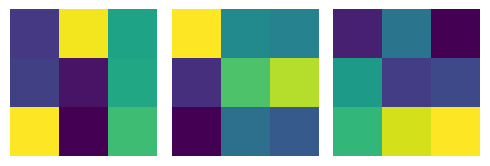

...

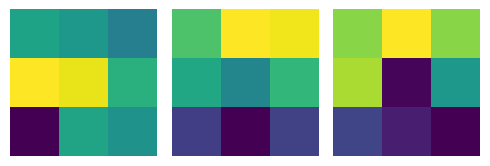

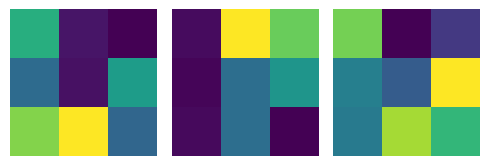

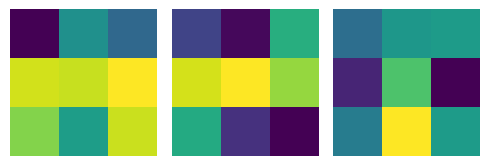

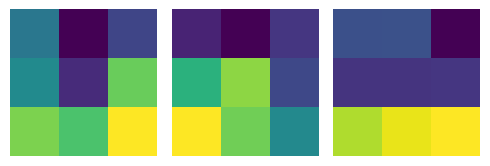

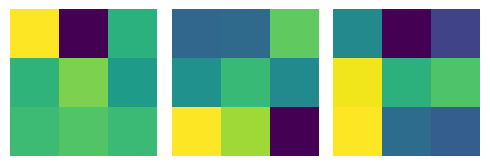

conv2d_1 (3, 3, 128, 128)
128


conv2d_2 (5, 5, 128, 256)
256


KeyboardInterrupt: ignored

<Figure size 500x500 with 0 Axes>

In [ ]:
for layer in model.layers:
    if 'conv' in layer.name:
        filters, bias= layer.get_weights()
        print(layer.name, filters.shape)
         #normalize filter values between  0 and 1 for visualization
        f_min, f_max = filters.min(), filters.max()
        filters = (filters - f_min) / (f_max - f_min)
        print(filters.shape[3])
        axis_x=1
        #plotting all the filters
        for i in range(filters.shape[3]):
        #for i in range(6):
            #get the filters
            filt=filters[:,:,:, i]
            plotFilters(filt)

In [ ]:
from tensorflow.keras import datasets, layers, models

model = models.Sequential()
model.add(layers.Conv2D(32, (3, 3), activation='relu', input_shape=(100, 100, 3)))
model.add(layers.MaxPooling2D((2, 2)))
#model.add(layers.Conv2D(64, (3, 3), activation='relu'))
#model.add(layers.MaxPooling2D((2, 2)))
#model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.Flatten())
model.add(layers.Dense(64, activation='relu'))
model.add(layers.Dense(6))

In [ ]:
KERAS_MODEL_NAME = "/content/drive/MyDrive/intel/tflt.h5"
model.save(KERAS_MODEL_NAME)

In [ ]:
val_loss, val_acc = model.evaluate(X_test, y_test)  # evaluate the out of sample data with model
print(val_loss)  # model's loss (error)
print(val_acc)  # model's accuracy

94/94 [==============================] - 1s 9ms/step - loss: 0.5978 - accuracy: 0.7777
0.5977690815925598
0.7776666879653931


In [ ]:
predictions = model.predict(X_test)

94/94 [==============================] - 1s 6ms/step


In [ ]:
print(np.argmax(predictions[10]))

5


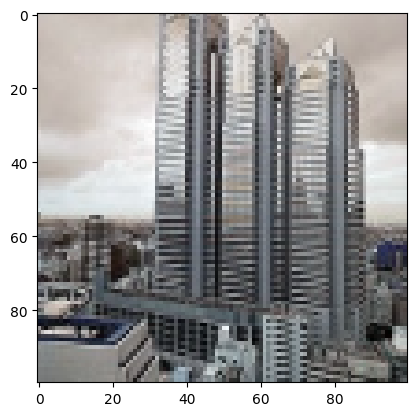

In [ ]:
plt.imshow(X_test[10],cmap=plt.cm.binary)
plt.show()

In [ ]:
opt = tf.keras.optimizers.Adam(learning_rate=0.01)
model.compile(optimizer=opt,  # Good default optimizer to start with
              loss='sparse_categorical_crossentropy',  # how will we calculate our "error." Neural network aims to minimize loss.
              metrics=['accuracy'])  # what to track

model.fit(X, y, batch_size=32, epochs=3, validation_split=0.3)

Epoch 1/3
307/307 [==============================] - 5s 14ms/step - loss: nan - accuracy: 0.1587 - val_loss: nan - val_accuracy: 0.1510
Epoch 2/3
307/307 [==============================] - 4s 12ms/step - loss: nan - accuracy: 0.1583 - val_loss: nan - val_accuracy: 0.1510
Epoch 3/3
307/307 [==============================] - 4s 12ms/step - loss: nan - accuracy: 0.1583 - val_loss: nan - val_accuracy: 0.1510


In [ ]:
X = X/255

In [ ]:
np.isnan(y).any()

False

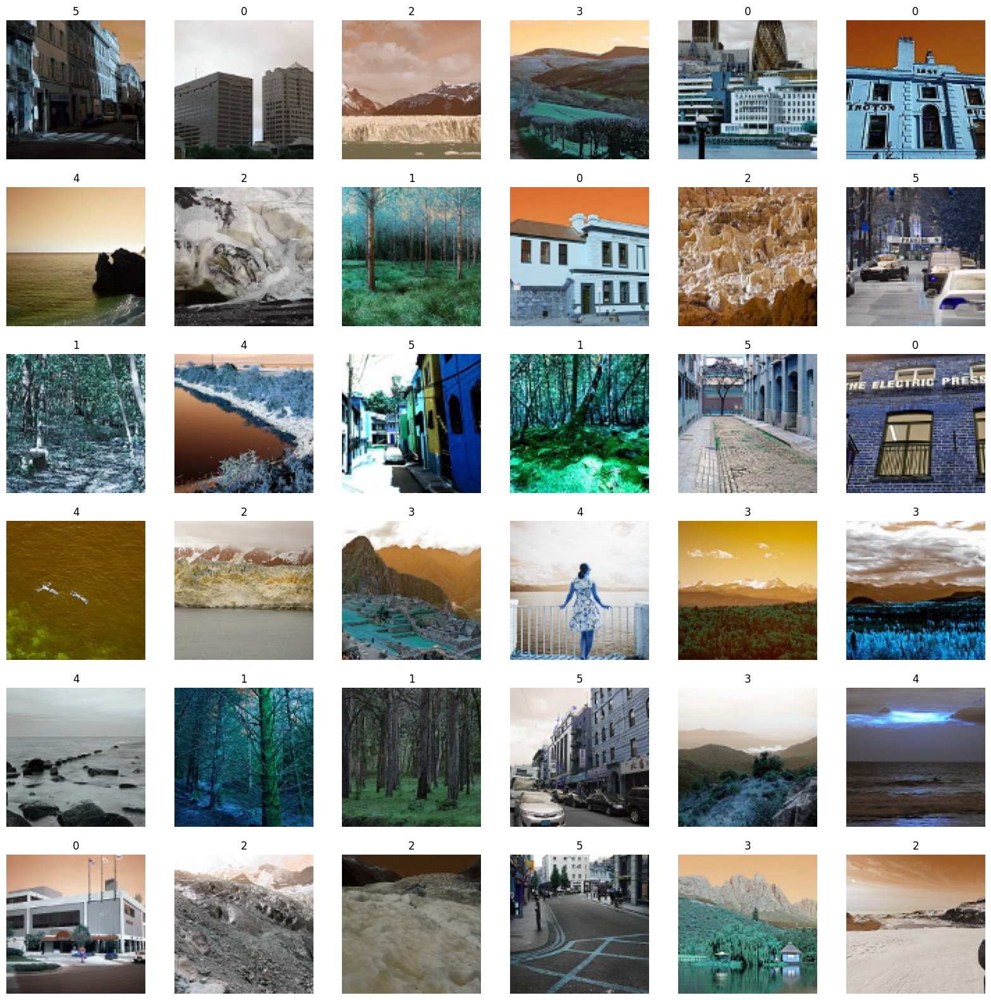

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X[i])
    plt.axis('off')
    plt.title((y[i]))

In [ ]:
model.compile(optimizer ='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_26 (Conv2D)          (None, 98, 98, 500)       14000     
                                                                 
 conv2d_27 (Conv2D)          (None, 96, 96, 350)       1575350   
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 24, 24, 350)      0         
 g2D)                                                            
                                                                 
 conv2d_28 (Conv2D)          (None, 22, 22, 300)       945300    
                                                                 
 conv2d_29 (Conv2D)          (None, 20, 20, 150)       405150    
                                                                 
 conv2d_30 (Conv2D)          (None, 18, 18, 80)        108080    
                                                      

In [ ]:
epochs = 10
ThisModel = model.fit(X, y, epochs=epochs,batch_size=64,verbose=1,validation_split=0.3)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 48, 48, 64)        4864      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 47, 47, 64)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 22, 22, 128)       204928    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 21, 21, 128)      0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 56448)             0         
                                                                 
 dense (Dense)               (None, 128)               7

In [ ]:
import tensorflow as tf

In [ ]:
TF_LITE_MODEL_FILE_NAME = "/content/drive/MyDrive/intel/tf_lite_model.tflite"

In [ ]:
tf_lite_converter = tf.lite.TFLiteConverter.from_keras_model(model)
tf_lite_converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = tf_lite_converter.convert()


In [ ]:
tflite_model_name = TF_LITE_MODEL_FILE_NAME
open(tflite_model_name, "wb").write(tflite_model)

9376352

In [ ]:
def get_file_size(file_path):
    size = os.path.getsize(file_path)
    return size


In [ ]:
def convert_bytes(size, unit=None):
    if unit == "KB":
        return print('File size: ' + str(round(size / 1024, 3)) + ' Kilobytes')
    elif unit == "MB":
        return print('File size: ' + str(round(size / (1024 * 1024), 3)) + ' Megabytes')
    else:
        return print('File size: ' + str(size) + ' bytes')


In [ ]:
convert_bytes(get_file_size(TF_LITE_MODEL_FILE_NAME), "KB")

File size: 9156.594 Kilobytes


In [ ]:
interpreter = tf.lite.Interpreter(model_path = TF_LITE_MODEL_FILE_NAME)
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print("Input Shape:", input_details[0]['shape'])
print("Input Type:", input_details[0]['dtype'])
print("Output Shape:", output_details[0]['shape'])
print("Output Type:", output_details[0]['dtype'])

Input Shape: [  1 100 100   3]
Input Type: <class 'numpy.float32'>
Output Shape: [1 6]
Output Type: <class 'numpy.float32'>


In [ ]:
X_test[200] = X_test[200].reshape((1, 100, 100, 3))

In [ ]:
from keras.utils import normalize
X_test[200] = normalize(X_test[200], axis = 1)

In [ ]:
test_imgs_numpy = np.array(X_test[200], dtype=np.float32)

In [ ]:

input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()
print("Input Shape:", input_details[0]['shape'])
print("Input Type:", input_details[0]['dtype'])
print("Output Shape:", output_details[0]['shape'])
print("Output Type:", output_details[0]['dtype'])

Input Shape: [  1 100 100   3]
Input Type: <class 'numpy.float32'>
Output Shape: [1 6]
Output Type: <class 'numpy.float32'>


In [ ]:
model_tf = "/content/drive/MyDrive/intel/tflt.h5"
model =tf.keras.models.load_model(model_tf)

OSError: ignored

In [ ]:
converter = tf.lite.TFLiteConverter.from_keras_model(model)
converter.optimizations = [tf.lite.Optimize.DEFAULT]
tflite_model = converter.convert()
open("/content/drive/MyDrive/intel/tflt.h5", "wb").write(tflite_model)


NameError: ignored

In [ ]:
import tensorflow as tf

from time import time

In [ ]:
tflite_model_path = "/content/drive/MyDrive/intel/tf_lite_model.tflite"

In [ ]:
interpreter = tf.lite.Interpreter(model_path=tflite_model_path)
interpreter.allocate_tensors()

In [ ]:
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

In [ ]:
print(input_details)

[{'name': 'serving_default_conv2d_input:0', 'index': 0, 'shape': array([  1, 100, 100,   3], dtype=int32), 'shape_signature': array([ -1, 100, 100,   3], dtype=int32), 'dtype': <class 'numpy.float32'>, 'quantization': (0.0, 0), 'quantization_parameters': {'scales': array([], dtype=float32), 'zero_points': array([], dtype=int32), 'quantized_dimension': 0}, 'sparsity_parameters': {}}]


In [ ]:
input_shape = input_details[0]['shape']
print(input_shape)

[  1 100 100   3]


In [ ]:
input_data = X_test[0]
input_data = np.float32(input_data)

In [ ]:
print(input_data.shape)

(100, 100, 3)


In [ ]:
input_data = input_data.reshape(1,100,100,3)
input_data.shape

(1, 100, 100, 3)

In [ ]:
interpreter.set_tensor(input_details[0]['index'], input_data)

time_before=time()
interpreter.invoke()
time_after=time()
total_tflite_time = time_after - time_before
print("Total prediction time for tflite without opt model is: ", total_tflite_time)

output_data_tflite = interpreter.get_tensor(output_details[0]['index'])

Total prediction time for tflite without opt model is:  0.12863469123840332


In [ ]:
print("The tflite w/o opt prediction for this image is: ", output_data_tflite)

The tflite w/o opt prediction for this image is:  [[0.01305656 0.909335   0.0243381  0.01345013 0.01126517 0.02855504]]


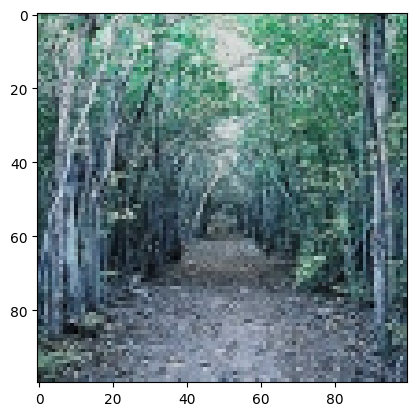

In [ ]:
plt.imshow(input_data.reshape(100,100,3))

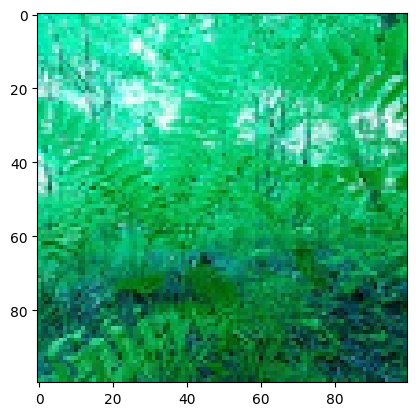

In [ ]:
plt.imshow(X_test[99])

In [ ]:
!ls

intel-image-classification.zip	seg_pred	      tflt.h5
logs				seg_test	      txr_edgetpu.log
logs20220927-050134		seg_train	      txr_edgetpu.tflite
model1				tf_lite_model.tflite  txr.tflite
